In [1]:
import time
import os
import sys

import numpy as np
import pandas as pd
import seaborn as sns
from cycler import cycler
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import Divider, Size
from matplotlib.ticker import MaxNLocator, MultipleLocator, FormatStrFormatter
import matplotlib.gridspec as gridspec
import matplotlib.colors as mcolors
from matplotlib.lines import Line2D
from matplotlib.patches import Patch, Rectangle
import smplotlib
from numpy.lib.stride_tricks import sliding_window_view
width_plot_s = 3.46457
width_plot_l = 6.85039

smplotlib.set_style(fontweight='normal', usetex=False, fontsize=9, figsize=(width_plot_s, width_plot_s), dpi=600)
# plt.rc('legend', labelcolor='k', fontsize=7, title_fontsize=8, markerscale=0.5) #fontsize of the legend

#paper
# Function to adjust color brightness
def adjust_brightness(color, factor):
    rgb = mcolors.hex2color(color)
    hsv = mcolors.rgb_to_hsv(rgb)
    hsv = (hsv[0],  min(1.0, hsv[1] * 1/factor), min(1.0, hsv[2] * factor))  # Ensure brightness stays within [0, 1]
    return mcolors.hsv_to_rgb(hsv)

colors =sns.color_palette("muted")
colors[5] = sns.color_palette("muted")[7]


light = sns.color_palette("pastel")
light[5] = sns.color_palette("pastel")[7]

plt.rcParams['axes.prop_cycle'] = cycler(color=colors)


dir = os.path.dirname(os.path.dirname('__file__'))+'/scripts/'
# print(dir)
sys.path.append('/Users/jmatthijsse/Documents/DVSI_project/DVSI_code/plotting/scripts')



import func as f
import vistools as vt
import plot
from polydust import Polydust, SizeDistribution

findfont: Failed to find font weight normal, now using 500.


Can not import slepc/petc not installed, will use scipy


# Figure 1

Ndust: 1, tau:[0.001], Zmax:1Hg, Z:0.05, alpha:1.0e-05
Mdust: 0.12452813202434047, Mgas: 1.7045465239722994 in domain
Dust-to-gas ratio in domain: 0.07305645828553764
Peak dust density: 0.49999394425299803
dz: 0.0009770395701025336

sigma gas: 0.8492569002123143
sigma vx: 0.22610894509805138
sigma vy: 0.8492569002123143 

sigma dust: 0.09915603280446661
sigma ux: 0.18876985324699708 

peak dvx/dz at z=-0.13776257938446504 is 0.0001714172188552329
peak dvy/dz at z=0.12603810454323397 is 0.09474086253723146, and has a FWHM of 0.17098192476795304 or sigma of 0.07260933808031425
peak dax/dz at z=0.12603810454323397 is 0.1894828645811491
peak day/dz at z=0.0898876404494382 is 0.00010645887848869448
peak dux/dz at z=0.23742061553492916 is 0.00022746238135342158

Ndust: 1, tau:[0.01], Zmax:1Hg, Z:0.05, alpha:1.0e-04
Mdust: 0.12452813202434047, Mgas: 1.7045465239722994 in domain
Dust-to-gas ratio in domain: 0.07305645828553764
Peak dust density: 0.49999394425299803
dz: 0.0009770395701025336

s

findfont: Failed to find font weight normal, now using 500.
findfont: Failed to find font weight normal, now using 500.
findfont: Failed to find font weight normal, now using 500.
findfont: Failed to find font weight bold, now using 800.


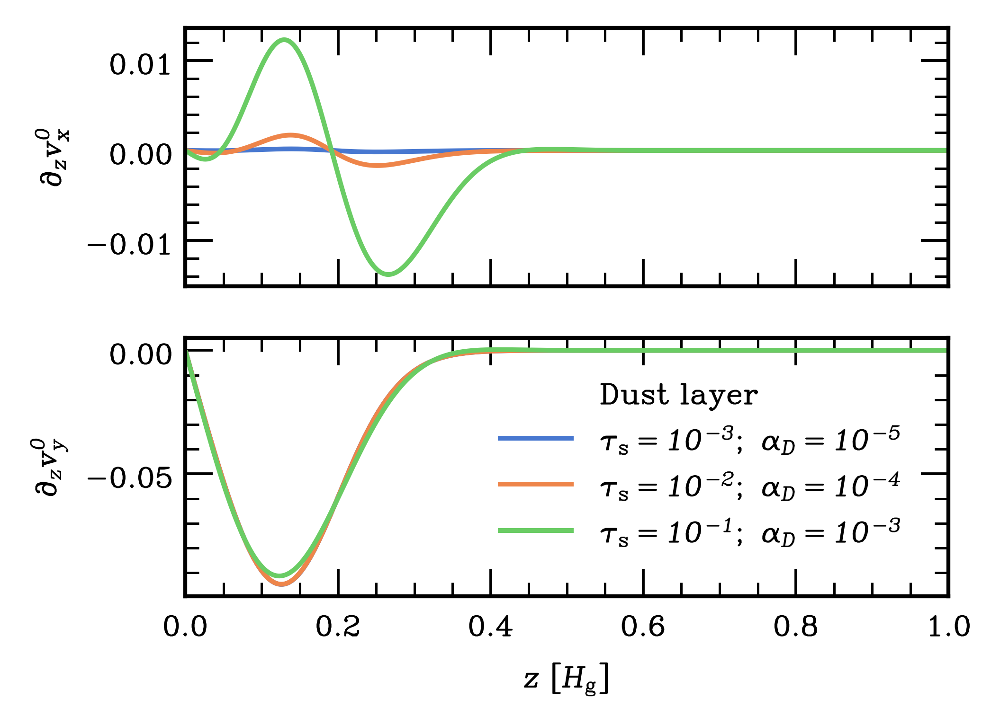

In [2]:


fig, ax = plt.subplots(2,1, figsize=(width_plot_s, width_plot_s*3/4), sharex=True)
############################################
z, rhog, gas_vx, gas_vy, gas_vz, ax_gas, ay_gas, az_gas, dust_rho, dust_ux, dust_uy, dust_uz, sigma, dens_dust, stokes_numbers, weights = f.anytical(ndust=1, tau=[1e-3],  hg=1, metallicity=.05, eta=0.05, alpha_viscosity=1e-5)
domain = z>0
z_centre = (z[:-1]+z[1:])/2
domain_c = z_centre >0
dvx_dz = np.diff(gas_vx)/np.diff(z)

ax[0].plot(z_centre[domain_c], dvx_dz[domain_c])
dvy_dz = np.diff(gas_vy)/np.diff(z)
ax[1].plot(z_centre[domain_c], dvy_dz[domain_c])

############################################
z, rhog, gas_vx, gas_vy, gas_vz, ax_gas, ay_gas, az_gas, dust_rho, dust_ux, dust_uy, dust_uz, sigma, dens_dust, stokes_numbers, weights = f.anytical(ndust=1, tau=[1e-2],  hg=1, metallicity=.05, eta=0.05, alpha_viscosity=1e-4)
domain = z>0
z_centre = (z[:-1]+z[1:])/2
domain_c = z_centre >0
dvx_dz = np.diff(gas_vx)/np.diff(z)

ax[0].plot(z_centre[domain_c], dvx_dz[domain_c])
dvy_dz = np.diff(gas_vy)/np.diff(z)
ax[1].plot(z_centre[domain_c], dvy_dz[domain_c])

############################################
z, rhog, gas_vx, gas_vy, gas_vz, ax_gas, ay_gas, az_gas, dust_rho, dust_ux, dust_uy, dust_uz, sigma, dens_dust, stokes_numbers, weights = f.anytical(ndust=1, tau=[1e-1],  hg=1, metallicity=.05, eta=0.05, alpha_viscosity=1e-3)
domain = z>0
z_centre = (z[:-1]+z[1:])/2
domain_c = z_centre >0
dvx_dz = np.diff(gas_vx)/np.diff(z)

ax[0].plot(z_centre[domain_c], dvx_dz[domain_c])
dvy_dz = np.diff(gas_vy)/np.diff(z)
ax[1].plot(z_centre[domain_c], dvy_dz[domain_c])


ax[0].set_ylabel(r'$\partial_z v^0_x$')
ax[1].set_ylabel(r'$\partial_z v^0_y$')
# ax[4].set_ylim(-0.1, 0.02)

legend_elments = [Patch(visible=False, label=r'Dust layer'),
                  Line2D([0], [0], color=colors[0], label=r'$\tau_\mathrm{s}=10^{-3}; \ \alpha_D=10^{-5}$'),
                  Line2D([0], [0], color=colors[1], label=r'$\tau_\mathrm{s}=10^{-2}; \ \alpha_D=10^{-4}$'),
                  Line2D([0], [0], color=colors[2], label=r'$\tau_\mathrm{s}=10^{-1}; \ \alpha_D=10^{-3}$')]

ax[1].legend(handles=legend_elments[:], loc='lower right')

pad = 3
for ax in ax:
    ax.xaxis.set_tick_params(pad=pad)
    ax.yaxis.set_tick_params(pad=pad)

plt.xlabel(r'$z \ [H_\mathrm{g}]$')

plt.xlim(0,1)

fig.savefig("plots/DVSI2_equilibrium.pdf",
            bbox_inches="tight", pad_inches=0.025, dpi=600)
plt.show()

# Figure 2

max 0.0014609238197533791 min -0.0014510370802749417
Ndust: 1, tau:[0.001], Zmax:0.5Hg, Z:0.05, alpha:1.0e-05
Mdust: 0.12452806954101862, Mgas: 0.9563062744504037 in domain
Dust-to-gas ratio in domain: 0.13021776900144866
Peak dust density: 0.4999939501653337
dz: 0.0009765625

sigma gas: 0.4242137738853503
sigma vx: 0.22682789278131635
sigma vy: 0.4242137738853503 

sigma dust: 0.09910761677282379
sigma ux: 0.18950703290870488 

peak dvx/dz at z=-0.138671875 is 0.00017141527720734677
peak dvy/dz at z=0.1259765625 is 0.09474097125767855, and has a FWHM of 0.1708984375 or sigma of 0.07257388430195476
peak dax/dz at z=0.1259765625 is 0.1894830800478644
peak day/dz at z=0.08984375 is 0.00010645887506548733
peak dux/dz at z=0.23828125 is 0.00022746171889261035



findfont: Failed to find font weight normal, now using 500.
findfont: Failed to find font weight normal, now using 500.


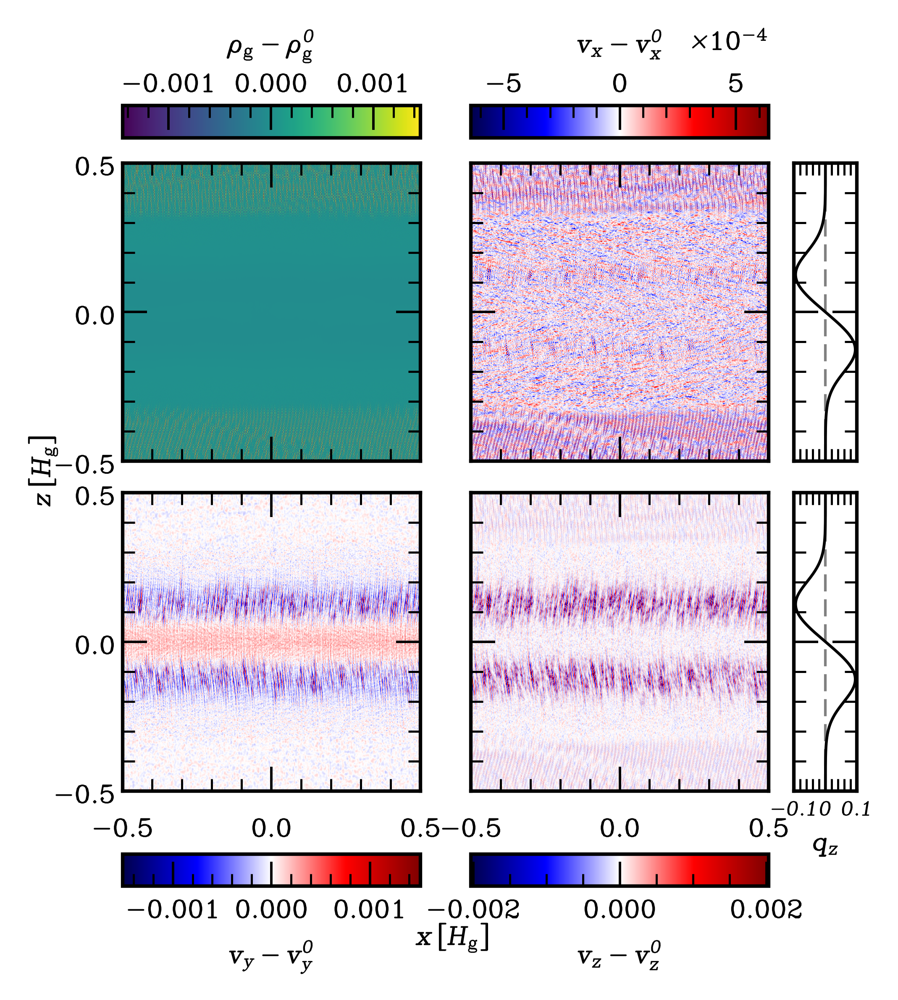

In [3]:
run_name = 'DVSI_mono_2D_Z05_eta05_a5_tse3_hg4x5'
folder = 'VSSI/'
dir = f'/Volumes/datajmatthijsse/phd_project2/raw_data/{folder+run_name}/fargo3d/'
df = pd.read_csv(f'/Volumes/datajmatthijsse/phd_project2/raw_data/{folder+run_name}/fargo3d/setups/{run_name}/initial.csv')
t0 = [df['rho_g'][3:-3],df['vx_g'][3:-3], df['vy_g'][3:-3], df['vz_g'][3:-3]]

frame=10

# read in the data from the directories
coord = vt.Coordinates(dir)
pf = vt.PolyFluid(dir)
dt = vt.time_stamps(dir, 2)[1]
t = dt*frame
frames = vt.time_stamps(dir, vt.max_save(dir))

# t0 = [0,0,0,0]
t0n = []
for i in range(4):
    if not isinstance(t0[i], (np.ndarray)):
        t0n.append(t0[i]*np.ones_like(coord.z))
    else:
        t0n.appendt(t0[i])
t0 = np.array(t0n)

# Get Stokes numbers, dust densities and equilibrium velocities
zmin = .5
domain = (coord.z > -zmin) & (coord.z < zmin)
coordx = coord.x
coordz = coord.z[domain]
meshX, meshZ = np.meshgrid(coordx, coordz, sparse=False, indexing='xy')
keplershear = 1.5*meshX
fluid = 0 
pf.read(frame)
rho = pf.Fluids[fluid].dens[domain,0,:]-t0[0][domain,None]
velx= pf.Fluids[fluid].velx[domain,0,:]-t0[1][domain,None]
vely = pf.Fluids[fluid].vely[domain,0,:]+keplershear-t0[2][domain,None]
velz = pf.Fluids[fluid].velz[domain,0,:]-t0[3][domain,None]

# # --- NEW EXAMPLE DATA (5 isotropic fields) ---
# nx = nz = 140
# zmin = 4
# coordx = np.linspace(-.5, .5, nx)
# coordz = np.linspace(-.5, .5, nz)
# domain = (coordz > -zmin) & (coordz < zmin)
# X, Z = np.meshgrid(coordx, coordz)

# dens = [
#     np.exp(-((X+0.9)**2 + (Z-0.1)**2) / 0.35),
#     np.exp(-((X-0.7)**2 + (Z+0.4)**2) / 0.50) + 0.06*np.cos(4*X)*np.cos(4*Z),
#     np.exp(-(X**2 + Z**2) / 0.85),
#     np.exp(-((X+0.2)**2 + (Z+0.9)**2) / 0.20),
# ]
# dens = [np.clip(d, 1e-9, None) for d in dens]  # keep positive if you switch on LogNorm later
print('max',np.max(rho), 'min', np.min(rho))
dens = [rho, velx, vely, velz]
fig, axes, cbs = plot.multi_heatmaps(
    dens, coordx, coordz,
    width_plot=width_plot_s,
    cbar_mode='per_panel',
    use_lognorm=False,
    symmetric=[False,True, True, True],
    vmax = [np.max(rho), None, None, None],
    vmin = [np.min(rho), None, None, None],
    cbar_labels=[r"$\rho_\mathrm{g}-\rho^0_\mathrm{g}$", r"$v_x-v_x^0$", r"$v_y-v_y^0$", r"$v_z-v_z^0$"],
    cmap=["viridis", "seismic", "seismic", "seismic"],
    xlabel=r"$x \, [H_\mathrm{g}]$",
    ylabel=r"$z \, [H_\mathrm{g}]$",
    panel_text=None,
    gap_x=0.2,
    gap_y=0.125,
    left=0.4, right=0.5,
    bottom=0.15, top=0.05,
    cbar_h=0.1275,
    xlabel_clearance=0.4,
    cbar_pad_top=0.1,
    cbar_pad_bottom=0.25,
)

# Fig 1 / analytical profile
tau = [1e-3]
alpha = 1e-5
Z = 0.05
eta = 0.05
zmin = .5

z, rhog, gas_vx, gas_vy, gas_vz, ax_gas, ay_gas, az_gas, dust_rho, dust_ux, dust_uy, dust_uz, sigma, rho, stokes, weights = \
    f.anytical(metallicity=Z, hg=zmin, tau=tau, eta=eta, alpha_viscosity=alpha, z=coordz)

q_z = np.gradient(gas_vy, z, edge_order=2)
qz_profile = np.asarray(q_z)

# ------------------------------------------------------------
# Add side plots
# ------------------------------------------------------------
fig.canvas.draw()

finite_qz = qz_profile[np.isfinite(qz_profile)]
if finite_qz.size:
    qz_max = np.max(np.abs(finite_qz))
else:
    qz_max = None

qz_max = 0.1

ax_qz_top = plot.add_side_profile(
    fig, axes[1], qz_profile, coordz,
    profile_gap=0.1,
    profile_width=0.25,
    xlabel=r"$q_z$",
    show_xlabels=False
)

ax_qz_bottom = plot.add_side_profile(
    fig, axes[3], qz_profile, coordz,
    profile_gap=0.1,
    profile_width=0.25,
    xlabel=r"$q_z$",
    show_xlabels=True
)
# ax_qz_bottom[0,1].set_ytickslabels(['','0','0.1'])

pad = 2
for ax in axes:
    ax.xaxis.set_tick_params(pad=pad*3)
    ax.yaxis.set_tick_params(pad=pad)
for cb in cbs:
    cb.ax.xaxis.set_tick_params(pad=pad)
    cb.ax.yaxis.set_tick_params(pad=pad)

fig.savefig("plots/DVSI2_gas_t50_sidebar.pdf",
            bbox_inches="tight", pad_inches=0.025, dpi=600)
plt.show()

# Figure 3

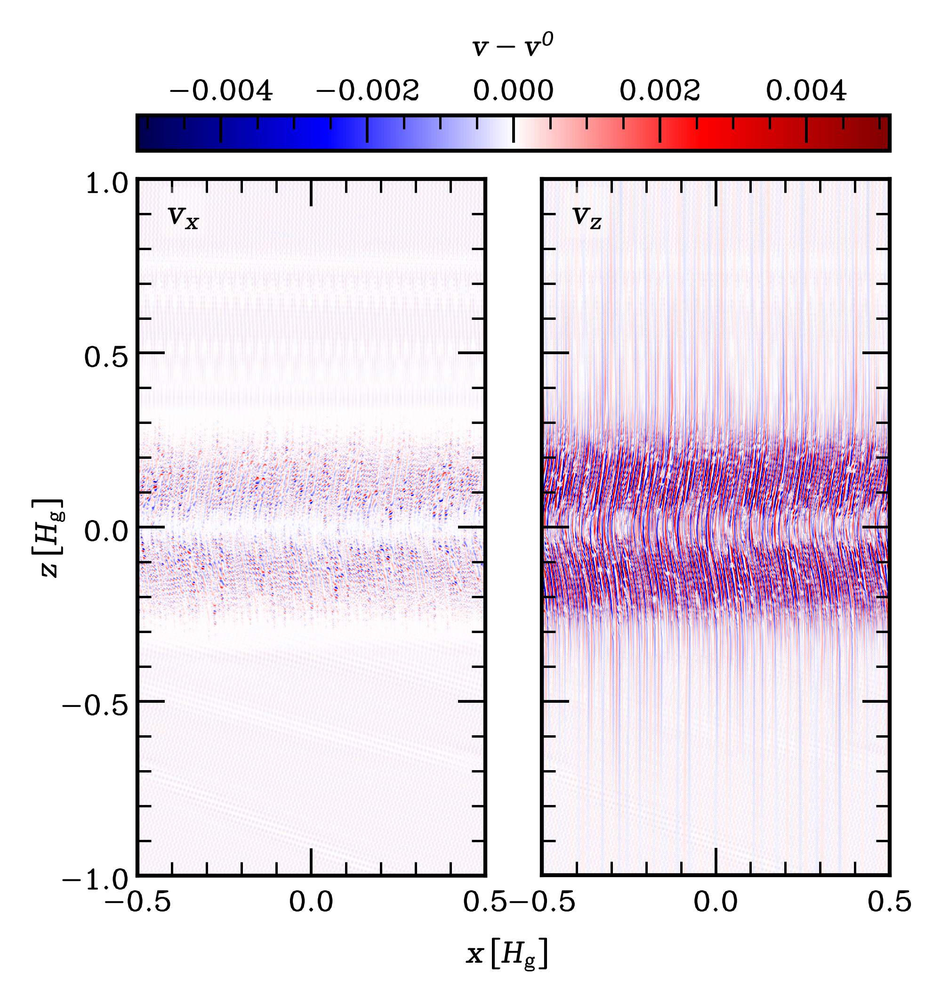

In [32]:
run_name = 'DVSI_mono_2D_Z05_eta05_a5_tse3_hg4x5'
folder = 'VSSI/'
dir = f'/Volumes/datajmatthijsse/phd_project2/raw_data/{folder+run_name}/fargo3d/'
df = pd.read_csv(f'/Volumes/datajmatthijsse/phd_project2/raw_data/{folder+run_name}/fargo3d/setups/{run_name}/initial.csv')
t0 = [df['rho_g'][3:-3],df['vx_g'][3:-3], df['vy_g'][3:-3], df['vz_g'][3:-3]]

frame=100

# read in the data from the directories
coord = vt.Coordinates(dir)
pf = vt.PolyFluid(dir)
dt = vt.time_stamps(dir, 2)[1]
t = dt*frame
frames = vt.time_stamps(dir, vt.max_save(dir))

t0n = []
for i in range(4):
    if not isinstance(t0[i], (np.ndarray)):
        t0n.append(t0[i]*np.ones_like(coord.z))
    else:
        t0n.appendt(t0[i])
t0 = np.array(t0n)

# Get Stokes numbers, dust densities and equilibrium velocities
zmin = 1.
domain = (coord.z > -zmin) & (coord.z < zmin)
coordx = coord.x
coordz = coord.z[domain]
meshX, meshZ = np.meshgrid(coordx, coordz, sparse=False, indexing='xy')
keplershear = 1.5*meshX
fluid = 0 
pf.read(frame)
rho = pf.Fluids[fluid].dens[domain,0,:]-t0[0][domain,None]
velx= pf.Fluids[fluid].velx[domain,0,:]-t0[1][domain,None]
vely = pf.Fluids[fluid].vely[domain,0,:]+keplershear-t0[2][domain,None]
velz = pf.Fluids[fluid].velz[domain,0,:]-t0[3][domain,None]

dens = [velx, velz]
fig, axes, cbs = plot.multi_heatmaps(
    dens, coordx, coordz,
    width_plot=width_plot_s,
    cbar_mode='shared',
    use_lognorm=False,
    symmetric=True,
    cbar_labels=[r"$v-v^0$"],
    cmap=["seismic"],
    xlabel=r"$x \, [H_\mathrm{g}]$",
    ylabel=r"$z \, [H_\mathrm{g}]$",
    panel_text=[r"$v_x$", r"$v_z$"],
    panel_text_kwargs=[dict(x=0.085, y=0.98, fontsize=10, color='k', ha="left", va="top", transform=None, bbox=dict(boxstyle="round, pad=0.15", facecolor="white", alpha=0.3, linewidth=0.0)),
                       dict(x=0.085, y=0.98, fontsize=10, color='k', ha="left", va="top", transform=None, bbox=dict(boxstyle="round, pad=0.15", facecolor="white", alpha=0.3, linewidth=0.0))],
    gap_x=0.2,
    gap_y=0.125,
    left=0.4, right=0.4,
    bottom=0.5, top=-0.25,
    cbar_h=0.125,
    xlabel_clearance=0,
    cbar_pad_top=0.1,
)

pad = 2
for ax in axes:
    ax.xaxis.set_tick_params(pad=pad)
    ax.yaxis.set_tick_params(pad=pad)
for cb in cbs:
    cb.ax.xaxis.set_tick_params(pad=pad)
    cb.ax.yaxis.set_tick_params(pad=pad)

fig.savefig("plots/DVSI2_gas_t500.pdf",
            bbox_inches="tight", pad_inches=0.025, dpi=600)
plt.show()

# Figure 4

max 0.035885703935034985 min -0.024245038566303168
Ndust: 1, tau:[0.001], Zmax:0.5Hg, Z:0.05, alpha:1.0e-05
Mdust: 0.12452806954101862, Mgas: 0.9563062744504037 in domain
Dust-to-gas ratio in domain: 0.13021776900144866
Peak dust density: 0.4999939501653337
dz: 0.0009765625

sigma gas: 0.4242137738853503
sigma vx: 0.22682789278131635
sigma vy: 0.4242137738853503 

sigma dust: 0.09910761677282379
sigma ux: 0.18950703290870488 

peak dvx/dz at z=-0.138671875 is 0.00017141527720734677
peak dvy/dz at z=0.1259765625 is 0.09474097125767855, and has a FWHM of 0.1708984375 or sigma of 0.07257388430195476
peak dax/dz at z=0.1259765625 is 0.1894830800478644
peak day/dz at z=0.08984375 is 0.00010645887506548733
peak dux/dz at z=0.23828125 is 0.00022746171889261035



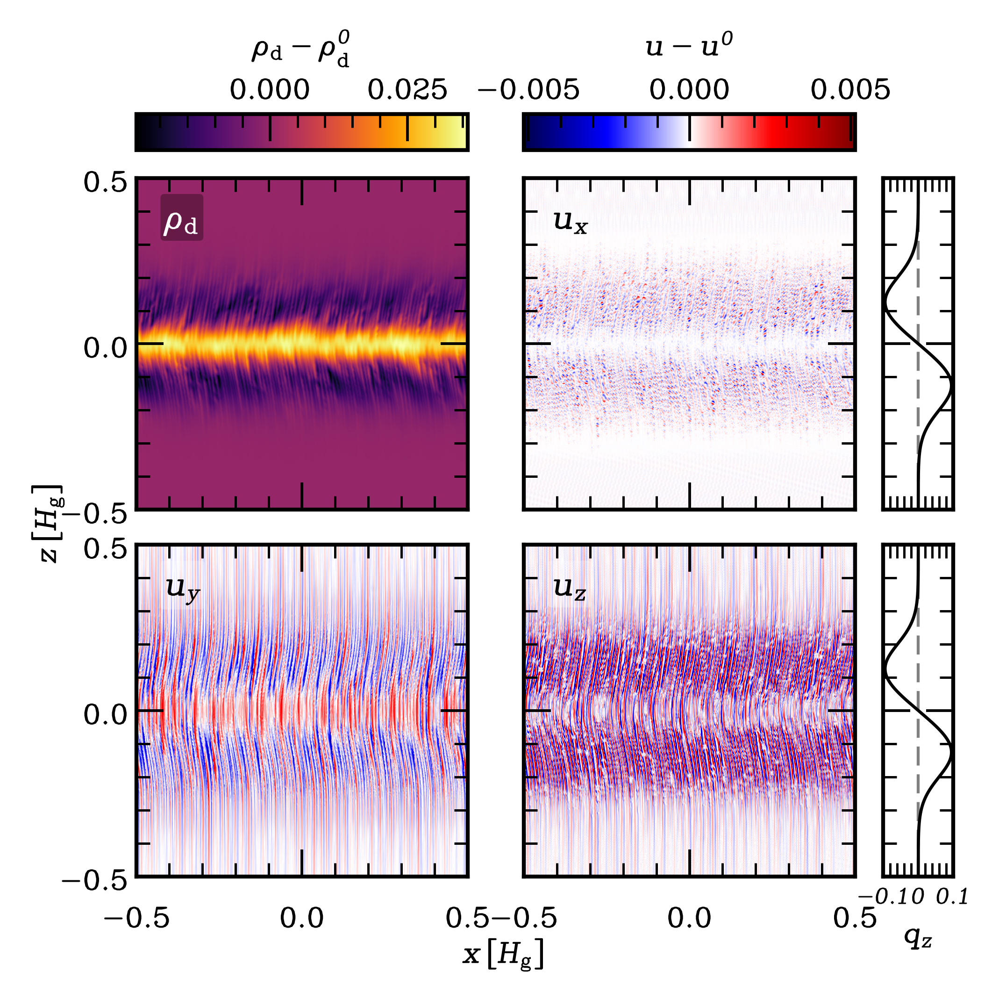

In [ ]:
run_name = 'DVSI_mono_2D_Z05_eta05_a5_tse3_hg4x5'
folder = 'VSSI/'
dir = f'/Volumes/datajmatthijsse/phd_project2/raw_data/{folder+run_name}/fargo3d/'
df = pd.read_csv(f'/Volumes/datajmatthijsse/phd_project2/raw_data/{folder+run_name}/fargo3d/setups/{run_name}/initial.csv')
t0 = [df['rho_d1'][3:-3],df['ux_d1'][3:-3], df['uy_d1'][3:-3], df['uz_d1'][3:-3]]

frame=100

# read in the data from the directories
coord = vt.Coordinates(dir)
pf = vt.PolyFluid(dir)
dt = vt.time_stamps(dir, 2)[1]
t = dt*frame
frames = vt.time_stamps(dir, vt.max_save(dir))

# t0 = [0,0,0,0]
t0n = []
for i in range(4):
    if not isinstance(t0[i], (np.ndarray)):
        t0n.append(t0[i]*np.ones_like(coord.z))
    else:
        t0n.appendt(t0[i])
t0 = np.array(t0n)

# Get Stokes numbers, dust densities and equilibrium velocities
zmin = .5
domain = (coord.z > -zmin) & (coord.z < zmin)
coordx = coord.x
coordz = coord.z[domain]
meshX, meshZ = np.meshgrid(coordx, coordz, sparse=False, indexing='xy')
keplershear = 1.5*meshX
fluid = 1 
pf.read(frame)
rho = pf.Fluids[fluid].dens[domain,0,:]-t0[0][domain,None]
velx= pf.Fluids[fluid].velx[domain,0,:]-t0[1][domain,None]
vely = pf.Fluids[fluid].vely[domain,0,:]+keplershear-t0[2][domain,None]
velz = pf.Fluids[fluid].velz[domain,0,:]-t0[3][domain,None]
print('max',np.max(rho), 'min', np.min(rho))
dens = [rho, velx, vely, velz]

# # --- NEW EXAMPLE DATA (5 isotropic fields) ---
# nx = nz = 140
# zmin = 4
# coordx = np.linspace(-.5, .5, nx)
# coordz = np.linspace(-.5, .5, nz)
# domain = (coordz > -zmin) & (coordz < zmin)
# X, Z = np.meshgrid(coordx, coordz)

# dens = [
#     np.exp(-((X+0.9)**2 + (Z-0.1)**2) / 0.35),
#     np.exp(-((X-0.7)**2 + (Z+0.4)**2) / 0.50) + 0.06*np.cos(4*X)*np.cos(4*Z),
#     np.exp(-(X**2 + Z**2) / 0.85),
#     np.exp(-((X+0.2)**2 + (Z+0.9)**2) / 0.20),
# ]
# dens = [np.clip(d, 1e-9, None) for d in dens]  # keep positive if you switch on LogNorm later
# rho = dens[1]


fig, axes, cbs = plot.multi_heatmaps(
    dens, coordx, coordz,
    width_plot=width_plot_s,
    cbar_mode='first_individual_rest_shared',
    use_lognorm=False,
    symmetric=[False,True],
    vmax = [np.max(rho), None],
    vmin = [np.min(rho), None],
    cbar_labels=[r"$\rho_\mathrm{d}-\rho^0_\mathrm{d}$", r"$u-u^0$"],
    cmap=["inferno", "seismic"],
    panel_text=[r"$\rho_\mathrm{d}$", r"$u_x$", r"$u_y$", r"$u_z$"],
    panel_text_kwargs=[dict(x=0.085, y=0.95, fontsize=10, color='white', ha="left", va="top", transform=None, bbox=dict(boxstyle="round, pad=0.1", facecolor="k", alpha=0.3, linewidth=0.0)),
                       dict(x=0.085, y=0.95, fontsize=10, color='k', ha="left", va="top", transform=None, bbox=dict(boxstyle="round, pad=0.1", facecolor="white", alpha=0.3, linewidth=0.0)),
                       dict(x=0.085, y=0.95, fontsize=10, color='k', ha="left", va="top", transform=None, bbox=dict(boxstyle="round, pad=0.1", facecolor="white", alpha=0.3, linewidth=0.0)),
                       dict(x=0.085, y=0.95, fontsize=10, color='k', ha="left", va="top", transform=None, bbox=dict(boxstyle="round, pad=0.1", facecolor="white", alpha=0.3, linewidth=0.0))],
    xlabel=r"$x \, [H_\mathrm{g}]$",
    ylabel=r"$z \, [H_\mathrm{g}]$",
    gap_x=0.2,
    gap_y=0.125,
    left=0.4, right=0.5,
    bottom=0.2, top=-0.4,
    cbar_h=0.1275,
    xlabel_clearance=0.55,
    cbar_pad_top=0.1,
    cbar_pad_bottom=0.25,
)

# Fig 1 / analytical profile
tau = [1e-3]
alpha = 1e-5
Z = 0.05
eta = 0.05
zmin = .5

z, rhog, gas_vx, gas_vy, gas_vz, ax_gas, ay_gas, az_gas, dust_rho, dust_ux, dust_uy, dust_uz, sigma, rho, stokes, weights = \
    f.anytical(metallicity=Z, hg=zmin, tau=tau, eta=eta, alpha_viscosity=alpha, z=coordz)

q_z = np.gradient(gas_vy, z, edge_order=2)
qz_profile = np.asarray(q_z)

# ------------------------------------------------------------
# Add side plots
# ------------------------------------------------------------
fig.canvas.draw()

finite_qz = qz_profile[np.isfinite(qz_profile)]
if finite_qz.size:
    qz_max = np.max(np.abs(finite_qz))
else:
    qz_max = None

qz_max = 0.1

ax_qz_top = plot.add_side_profile(
    fig, axes[1], qz_profile, coordz,
    profile_gap=0.1,
    profile_width=0.25,
    xlabel=r"$q_z$",
    show_xlabels=False
)

ax_qz_bottom = plot.add_side_profile(
    fig, axes[3], qz_profile, coordz,
    profile_gap=0.1,
    profile_width=0.25,
    xlabel=r"$q_z$",
    show_xlabels=True
)
# ax_qz_bottom[0,1].set_ytickslabels(['','0','0.1'])

pad = 2
for ax in axes:
    ax.xaxis.set_tick_params(pad=pad*3)
    ax.yaxis.set_tick_params(pad=pad)
for cb in cbs:
    cb.ax.xaxis.set_tick_params(pad=pad)
    cb.ax.yaxis.set_tick_params(pad=pad)

fig.savefig("plots/DVSI2_dust_t500_sidebar.pdf",
            bbox_inches="tight", pad_inches=0.025, dpi=600)
plt.show()

# Figure 5

5.0 [  0.   5.  10.  15.  20.  25.  30.  35.  40.  45.  50.  55.  60.  65.
  70.  75.  80.  85.  90.  95. 100. 105. 110. 115. 120. 125. 130. 135.
 140. 145. 150.]
Ndust: 1, tau:[0.001], Zmax:4Hg, Z:0.05, alpha:1.0e-05
Mdust: 0.12452813202434755, Mgas: 2.495211506193665 in domain
Dust-to-gas ratio in domain: 0.04990684425558366
Peak dust density: 0.4999939501653337
dz: 0.0009765625

sigma gas: 0.9956376061571125
sigma vx: 0.22682789278131635
sigma vy: 3.39661292462845 

sigma dust: 0.09910761677282379
sigma ux: 0.18950703290870488 

peak dvx/dz at z=-0.138671875 is 0.00017141527720734677
peak dvy/dz at z=0.1259765625 is 0.09474097125767855, and has a FWHM of 0.1708984375 or sigma of 0.07257388430195476
peak dax/dz at z=0.1259765625 is 0.1894830800478644
peak day/dz at z=0.08984375 is 0.00010645887506548733
peak dux/dz at z=0.23828125 is 0.00022746171889261035

Ndust: 1, tau:[0.001], Zmax:4Hg, Z:0.05, alpha:1.0e-05
Mdust: 0.12452813202434755, Mgas: 2.495211506193665 in domain
Dust-to-gas

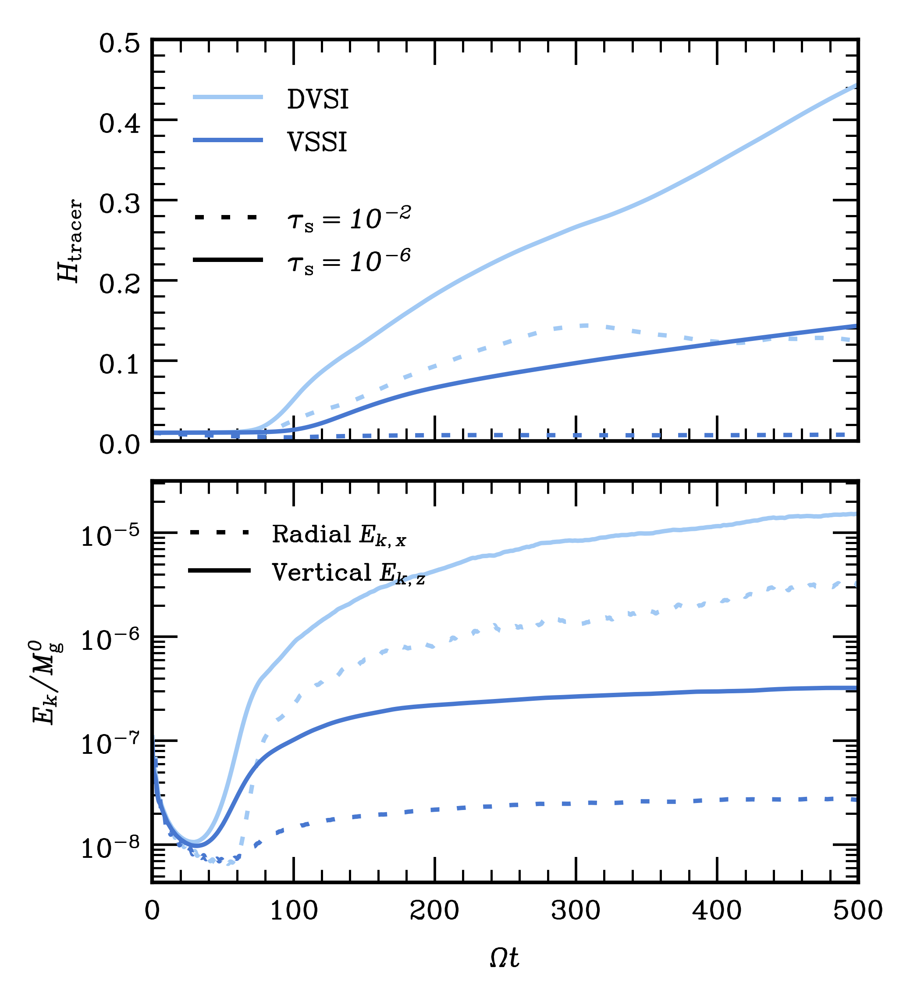

In [56]:
tau = [1e-3]
alpha = 1e-5
Z = 0.05
eta = 0.05


fig =  plt.figure(figsize=(width_plot_s, width_plot_s*1.2))
gs_main = gridspec.GridSpec(2,1, figure=fig, height_ratios=[1, 1], hspace=.1)

ax0 = fig.add_subplot(gs_main[0])
ax1 = fig.add_subplot(gs_main[1], sharex=ax0)

#############################################################
run_name = 'DVSI_gas_2D_Z05_eta05_a5_tse3_hg4x5'
folder = 'DVSI/'
dir = f'/Volumes/datajmatthijsse/phd_project2/raw_data/{folder+run_name}/fargo3d/'
coord = vt.Coordinates(dir)
dt = vt.time_stamps(dir, 2)[1]
frames = vt.time_stamps(dir, vt.max_save(dir))
print(dt, frames)
t = 750#int(frames[-1]*dt)

z, rhog, gas_vx, gas_vy, gas_vz, ax_gas, ay_gas, az_gas, dust_rho, dust_ux, dust_uy, dust_uz, sigma, rho, stokes, weights = \
    f.anytical(metallicity=Z, hg=4, tau=tau, eta=eta, alpha_viscosity=alpha, z=coord.z)
m0 = sum(rhog*coord.dz)

mass_tracer1 =(np.fromfile(dir+'monitor/tracer1/'+"mass_1d_Z_raw.dat"))
lenght_t1 = len(mass_tracer1)
mass_tracer1 = mass_tracer1.reshape(int(lenght_t1/coord.nz),coord.nz)
mass_tracer2 =(np.fromfile(dir+'monitor/tracer2/'+"mass_1d_Z_raw.dat"))
lenght_t2 = len(mass_tracer2)
mass_tracer2 = mass_tracer2.reshape(int(lenght_t2/coord.nz),coord.nz)
Ex_gas =(np.loadtxt(dir+'monitor/gas/'+"eky.dat"))#[:].reshape(t*10,nz)
Ez_gas =(np.loadtxt(dir+'monitor/gas/'+"ekz.dat"))#[:].reshape(t*10,nz)
h_tracer1 = f.h_tracer(mass_tracer1, coord.z, coord.dz)
h_tracer2 = f.h_tracer(mass_tracer2, coord.z, coord.dz)

ax0.plot(np.linspace(0,t,int(lenght_t1/coord.nz)), h_tracer1, color=light[0])
ax0.plot(np.linspace(0,t,int(lenght_t2/coord.nz)), h_tracer2, color=light[0], linestyle='dotted')
ax1.plot(Ex_gas[:,0], Ex_gas[:,1]/m0,  color=light[0], linestyle='dotted')
ax1.plot(Ez_gas[:,0], Ez_gas[:,1]/m0,  color=light[0])

#############################################################
run_name = 'DVSI_mono_2D_Z05_eta05_a5_tse3_hg4x5'
folder = 'VSSI/'
dir = f'/Volumes/datajmatthijsse/phd_project2/raw_data/{folder+run_name}/fargo3d/'
coord = vt.Coordinates(dir)
dt = vt.time_stamps(dir, 2)[1]
frames = vt.time_stamps(dir, vt.max_save(dir))
t = int(frames[-1]*dt)

z, rhog, gas_vx, gas_vy, gas_vz, ax_gas, ay_gas, az_gas, dust_rho, dust_ux, dust_uy, dust_uz, sigma, rho, stokes, weights = \
    f.anytical(metallicity=Z, hg=4, tau=tau, eta=eta, alpha_viscosity=alpha, z=coord.z)
m0 = sum(rhog*coord.dz)

mass_tracer1 =(np.fromfile(dir+'monitor/tracer1/'+"mass_1d_Z_raw.dat"))
lenght_t1 = len(mass_tracer1)
mass_tracer1 = mass_tracer1.reshape(int(lenght_t1/coord.nz),coord.nz)
mass_tracer2 =(np.fromfile(dir+'monitor/tracer2/'+"mass_1d_Z_raw.dat"))
lenght_t2 = len(mass_tracer2)
mass_tracer2 = mass_tracer2.reshape(int(lenght_t2/coord.nz),coord.nz)
Ex_gas =(np.loadtxt(dir+'monitor/gas/'+"eky.dat"))#[:].reshape(t*10,nz)
Ez_gas =(np.loadtxt(dir+'monitor/gas/'+"ekz.dat"))#[:].reshape(t*10,nz)
h_tracer1 = f.h_tracer(mass_tracer1, coord.z, coord.dz)
h_tracer2 = f.h_tracer(mass_tracer2, coord.z, coord.dz)

ax0.plot(np.linspace(0,t,int(lenght_t1/coord.nz)), h_tracer1, color=colors[0])
ax0.plot(np.linspace(0,t,int(lenght_t2/coord.nz)), h_tracer2, color=colors[0], linestyle='dotted')
ax1.plot(Ex_gas[:,0], Ex_gas[:,1]/m0,  color=colors[0], linestyle='dotted')
ax1.plot(Ez_gas[:,0], Ez_gas[:,1]/m0,  color=colors[0])



ax0.set_ylabel(r'$H_\mathrm{tracer}$')
ax0.set_ylim(0,0.5)
ax1.set_yscale('log')
ax1.set_ylabel(r'$E_k/M^0_\mathrm{g}$')
plt.setp(ax0.get_xticklabels(), visible=False)

legend1 = ax0.legend(handles = [#Patch(visible=False, label=r'Stokes Numb.'),
                                  Line2D([0], [0], color='k', linestyle='dotted', label=r'$\tau_\mathrm{s}=10^{-2}$'),
                                  Line2D([0], [0], color='k', label=r'$\tau_\mathrm{s}=10^{-6}$'),],
                                  loc='center left')
ax0.add_artist(legend1)

legend_elments = [Line2D([0], [0], color=light[0],  label=r'$\mathtt{DVSI}$'),
                  Line2D([0], [0], color=colors[0],  label=r'$\mathtt{VSSI}$')]

ax0.legend(handles=legend_elments[:], loc='upper left')


legend2 = ax1.legend(handles = [#Patch(visible=False, label=r'Direction'),
                        Line2D([0], [0], color='k', linestyle='dotted', label=r'Radial $E_{k,x}$'),
                        Line2D([0], [0], color='k', label=r'Vertical $E_{k,z}$')],
                        loc='upper left', fontsize=8, title_fontsize=9, markerscale=.6)

ax1.add_artist(legend2)

ax0.set_ylim(0,0.5)
plt.xlim(0, 500)
plt.xlabel(r'$\Omega t$')

pad = 3
ax0.xaxis.set_tick_params(pad=pad)
ax0.yaxis.set_tick_params(pad=pad)
ax1.xaxis.set_tick_params(pad=pad)
ax1.yaxis.set_tick_params(pad=pad)

fig.savefig("plots/DVSI2_feedback_Htracer_Ek.pdf",
            bbox_inches="tight", pad_inches=0.025, dpi=600)
plt.show()

# Figure 6

Ndust: 1, tau:[0.001], Zmax:4Hg, Z:0.05, alpha:1.0e-05
Mdust: 0.12452813202434755, Mgas: 2.495211506193665 in domain
Dust-to-gas ratio in domain: 0.04990684425558366
Peak dust density: 0.4999939501653337
dz: 0.0009765625

sigma gas: 0.9956376061571125
sigma vx: 0.22682789278131635
sigma vy: 3.39661292462845 

sigma dust: 0.09910761677282379
sigma ux: 0.18950703290870488 

peak dvx/dz at z=-0.138671875 is 0.00017141527720734677
peak dvy/dz at z=0.1259765625 is 0.09474097125767855, and has a FWHM of 0.1708984375 or sigma of 0.07257388430195476
peak dax/dz at z=0.1259765625 is 0.1894830800478644
peak day/dz at z=0.08984375 is 0.00010645887506548733
peak dux/dz at z=0.23828125 is 0.00022746171889261035

Ndust: 1, tau:[0.001], Zmax:4Hg, Z:0.05, alpha:1.0e-05
Mdust: 0.12452813202434755, Mgas: 2.495211506193665 in domain
Dust-to-gas ratio in domain: 0.04990684425558366
Peak dust density: 0.4999939501653337
dz: 0.0009765625

sigma gas: 0.9956376061571125
sigma vx: 0.22682789278131635
sigma vy:

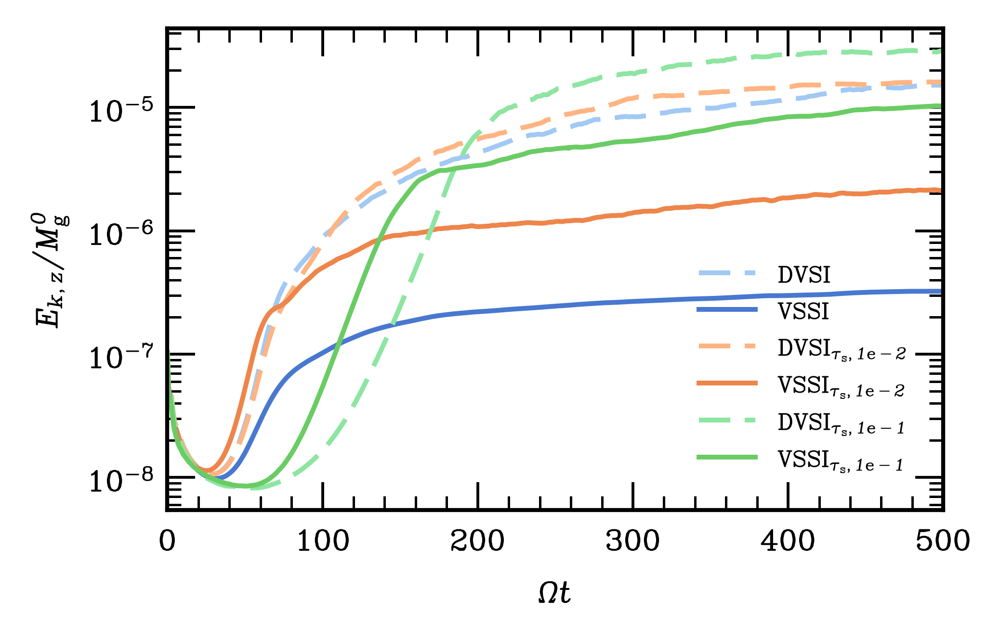

In [35]:
fig =  plt.figure(figsize=(width_plot_s, width_plot_s*10/16))


#############################################################
run_name = 'DVSI_gas_2D_Z05_eta05_a5_tse3_hg4x5'
folder = 'DVSI/'
dir = f'/Volumes/datajmatthijsse/phd_project2/raw_data/{folder+run_name}/fargo3d/'
coord = vt.Coordinates(dir)

z, rhog, gas_vx, gas_vy, gas_vz, ax_gas, ay_gas, az_gas, dust_rho, dust_ux, dust_uy, dust_uz, sigma, rho, stokes, weights = \
    f.anytical(metallicity=Z, hg=4, tau=tau, eta=eta, alpha_viscosity=alpha, z=coord.z)
m0 = sum(rhog*coord.dz)

Ez_gas =(np.loadtxt(dir+'monitor/gas/'+"ekz.dat"))#[:].reshape(t*10,nz)
plt.plot(Ez_gas[:,0], Ez_gas[:,1]/m0,  color=light[0], linestyle='dashed')

#############################################################
run_name = 'DVSI_mono_2D_Z05_eta05_a5_tse3_hg4x5'
folder = 'VSSI/'
dir = f'/Volumes/datajmatthijsse/phd_project2/raw_data/{folder+run_name}/fargo3d/'
coord = vt.Coordinates(dir)

z, rhog, gas_vx, gas_vy, gas_vz, ax_gas, ay_gas, az_gas, dust_rho, dust_ux, dust_uy, dust_uz, sigma, rho, stokes, weights = \
    f.anytical(metallicity=Z, hg=4, tau=tau, eta=eta, alpha_viscosity=alpha, z=coord.z)
m0 = sum(rhog*coord.dz)

Ez_gas =(np.loadtxt(dir+'monitor/gas/'+"ekz.dat"))#[:].reshape(t*10,nz)
plt.plot(Ez_gas[:,0], Ez_gas[:,1]/m0,  color=colors[0])

#############################################################
run_name = 'DVSI_gas_2D_Z05_eta05_a4_tse2_hg4x5'
folder = 'DVSI/'
dir = f'/Volumes/datajmatthijsse/phd_project2/raw_data/{folder+run_name}/fargo3d/'
coord = vt.Coordinates(dir)

z, rhog, gas_vx, gas_vy, gas_vz, ax_gas, ay_gas, az_gas, dust_rho, dust_ux, dust_uy, dust_uz, sigma, rho, stokes, weights = \
    f.anytical(metallicity=Z, hg=4, tau=tau, eta=eta, alpha_viscosity=alpha, z=coord.z)
m0 = sum(rhog*coord.dz)

Ez_gas =(np.loadtxt(dir+'monitor/gas/'+"ekz.dat"))#[:].reshape(t*10,nz)
plt.plot(Ez_gas[:,0], Ez_gas[:,1]/m0,  color=light[1], linestyle='dashed')

#############################################################
run_name = 'DVSI_mono_2D_Z05_eta05_a4_tse2_hg4x5'
folder = 'VSSI/'
dir = f'/Volumes/datajmatthijsse/phd_project2/raw_data/{folder+run_name}/fargo3d/'
coord = vt.Coordinates(dir)

z, rhog, gas_vx, gas_vy, gas_vz, ax_gas, ay_gas, az_gas, dust_rho, dust_ux, dust_uy, dust_uz, sigma, rho, stokes, weights = \
    f.anytical(metallicity=Z, hg=4, tau=tau, eta=eta, alpha_viscosity=alpha, z=coord.z)
m0 = sum(rhog*coord.dz)

Ez_gas =(np.loadtxt(dir+'monitor/gas/'+"ekz.dat"))#[:].reshape(t*10,nz)
t_restart = Ez_gas[:,0]
diffs = np.diff(t_restart)
drops = diffs < 0
step_offsets = np.zeros_like(t_restart)
step_offsets[1:] = np.where(drops, (t_restart[:-1] + 1) - t_restart[1:], 0)
time = t_restart + np.cumsum(step_offsets)
plt.plot(time, Ez_gas[:,1]/m0,  color=colors[1])

#############################################################
run_name = 'DVSI_gas_2D_Z05_eta05_a3_tse1_hg4x5'
folder = 'DVSI/'
dir = f'/Volumes/datajmatthijsse/phd_project2/raw_data/{folder+run_name}/fargo3d/'
coord = vt.Coordinates(dir)

z, rhog, gas_vx, gas_vy, gas_vz, ax_gas, ay_gas, az_gas, dust_rho, dust_ux, dust_uy, dust_uz, sigma, rho, stokes, weights = \
    f.anytical(metallicity=Z, hg=4, tau=tau, eta=eta, alpha_viscosity=alpha, z=coord.z)
m0 = sum(rhog*coord.dz)

Ez_gas =(np.loadtxt(dir+'monitor/gas/'+"ekz.dat"))#[:].reshape(t*10,nz)
t_restart = Ez_gas[:,0]
diffs = np.diff(t_restart)
drops = diffs < 0
step_offsets = np.zeros_like(t_restart)
step_offsets[1:] = np.where(drops, (t_restart[:-1] + 1) - t_restart[1:], 0)
time = t_restart + np.cumsum(step_offsets)
plt.plot(time, Ez_gas[:,1]/m0,  color=light[2], linestyle='dashed')

#############################################################
run_name = 'DVSI_mono_2D_Z05_eta05_a3_tse1_hg4x5'
folder = 'VSSI/'
dir = f'/Volumes/datajmatthijsse/phd_project2/raw_data/{folder+run_name}/fargo3d/'
coord = vt.Coordinates(dir)

z, rhog, gas_vx, gas_vy, gas_vz, ax_gas, ay_gas, az_gas, dust_rho, dust_ux, dust_uy, dust_uz, sigma, rho, stokes, weights = \
    f.anytical(metallicity=Z, hg=4, tau=tau, eta=eta, alpha_viscosity=alpha, z=coord.z)
m0 = sum(rhog*coord.dz)

Ez_gas = np.loadtxt(dir + 'monitor/gas/ekz.dat')
t = Ez_gas[:, 0]
y = Ez_gas[:, 1] / m0
# Find restarts
restarts = np.where(np.diff(t) < 0)[0] + 1
bounds = np.r_[0, restarts, len(t)]
# Indices to retain
keep = np.arange(bounds[1])
for start, end in zip(bounds[1:-1], bounds[2:]):
    # Previous data that has not been removed
    y_old = y[keep]
    # New restarted data
    y_new = y[start:end]
    # Match 5 consecutive values
    n = min(5, len(y_old), len(y_new))
    windows = sliding_window_view(y_old, n)
    matches = np.where(np.all(np.isclose(windows, y_new[:n], rtol=1e-5, atol=1e-12), axis=1))[0]
    if len(matches):
        # Most recent matching sequence
        j = matches[-1]
        # Remove old data from match onwards
        # Keep the restarted segment instead
        keep = np.r_[keep[:j], np.arange(start, end)]
    else:
        keep = np.r_[keep, np.arange(start, end)]
# Cleaned array
Ez_gas_clean = Ez_gas[keep]
# Initial timestep
dt = np.diff(t)[np.diff(t) > 0][0]
# Force constant dt after removing overlapping data
time = t[0] + np.arange(len(keep)) * dt
Ez_gas_clean = Ez_gas[keep]
plt.plot(time, Ez_gas_clean[:, 1] / m0, color=colors[2])


legend_elments = [#Patch(visible=False, label=r'Metallicity'),
                  Line2D([0], [0], color=light[0],  label=r'$\mathtt{DVSI}$', linestyle='dashed'),
                  Line2D([0], [0], color=colors[0], label=r'$\mathtt{VSSI}$'),
                  Line2D([0], [0], color=light[1],  label=r'$\mathtt{DVSI}_{\tau_\mathrm{s}, 1\mathrm{e}-2}$', linestyle='dashed'),
                  Line2D([0], [0], color=colors[1], label=r'$\mathtt{VSSI}_{\tau_\mathrm{s}, 1\mathrm{e}-2}$'),
                  Line2D([0], [0], color=light[2],  label=r'$\mathtt{DVSI}_{\tau_\mathrm{s}, 1\mathrm{e}-1}$', linestyle='dashed'),
                  Line2D([0], [0], color=colors[2],  label=r'$\mathtt{VSSI}_{\tau_\mathrm{s}, 1\mathrm{e}-1}$')]

plt.legend(handles=legend_elments[:], loc='lower right', fontsize=7, title_fontsize=8, markerscale=.5, framealpha=.75, frameon=False)

plt.yscale('log')
plt.xlim(0,500)
plt.ylabel(r'$E_{k,z}/M^0_\mathrm{g}$')

plt.xlabel(r'$\Omega t$')

pad = 3
plt.tick_params(axis='both', pad=pad)


fig.savefig("plots/DVSI2_dustlayer_Ek.pdf",
            bbox_inches="tight", pad_inches=0.025, dpi=600)
plt.show()



# Figure 7

750.0
1000.0


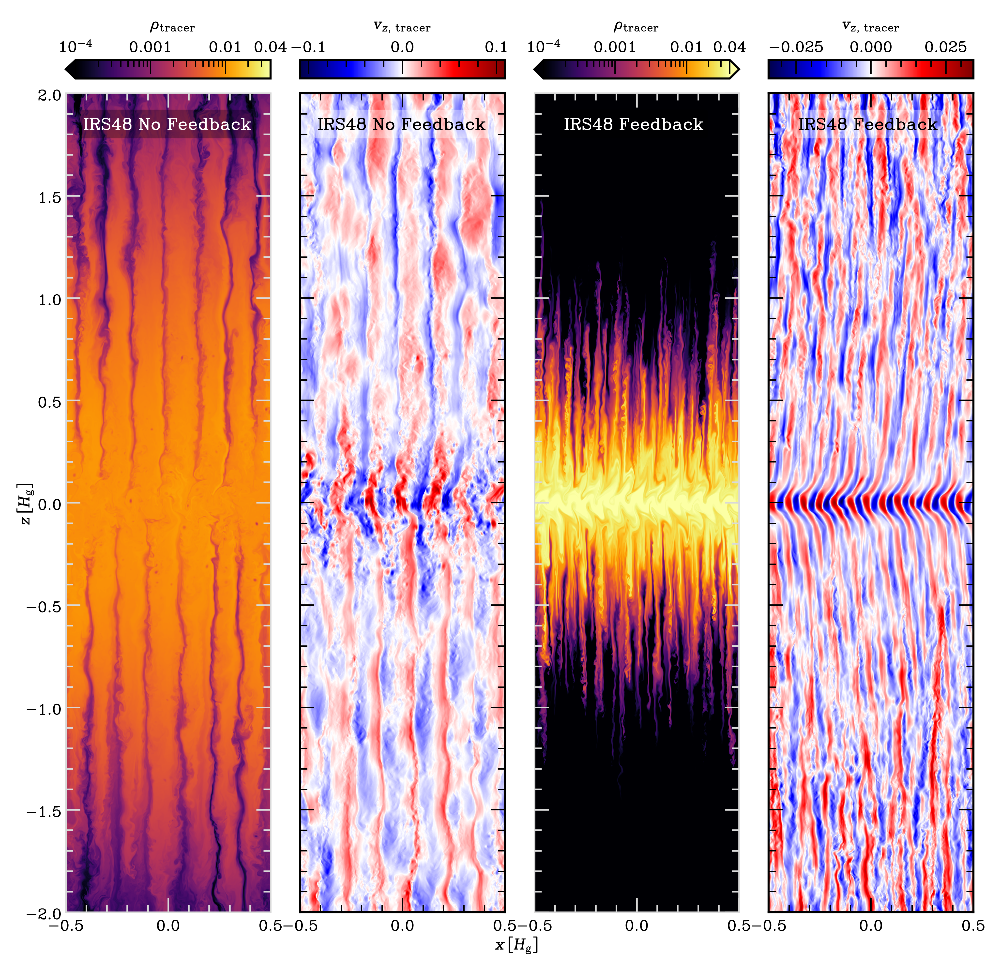

In [ ]:
run_name = 'IRS48_gas_2D_Z0425_eta05_a3_ts35e1_hg4x5'
folder = 'IRS48/'
dir = f'/Volumes/datajmatthijsse/phd_project2/raw_data/{folder+run_name}/fargo3d/'
df = pd.read_csv(f'/Volumes/datajmatthijsse/phd_project2/raw_data/{folder+run_name}/fargo3d/setups/{run_name}/initial.csv')

frame=150

# read in the data from the directories
coord = vt.Coordinates(dir)
pf = vt.PolyFluid(dir)
dt = vt.time_stamps(dir, 2)[1]
t = dt*frame
print(t)

# Get Stokes numbers, dust densities and equilibrium velocities
zmin = 2.0
domain = (coord.z > -zmin) & (coord.z < zmin)
coordx = coord.x
coordz = coord.z[domain]
meshX, meshZ = np.meshgrid(coordx, coordz, sparse=False, indexing='xy')
keplershear = 1.5*meshX
fluid = 1
pf.read(frame)
rho1 = pf.Fluids[fluid].dens[domain,0,:]
velz1 = pf.Fluids[fluid].velz[domain,0,:]

run_name = 'IRS48_mono_2D_Z0425_eta05_a3_ts35e1_hg4x5'
folder = 'IRS48/'
dir = f'/Volumes/datajmatthijsse/phd_project2/raw_data/{folder+run_name}/fargo3d/'
df = pd.read_csv(f'/Volumes/datajmatthijsse/phd_project2/raw_data/{folder+run_name}/fargo3d/setups/{run_name}/initial.csv')

frame=200

# read in the data from the directories
coord = vt.Coordinates(dir)
pf = vt.PolyFluid(dir)
dt = vt.time_stamps(dir, 2)[1]
t = dt*frame
print(t)

# Get Stokes numbers, dust densities and equilibrium velocities
zmin = 2.0
domain = (coord.z > -zmin) & (coord.z < zmin)
coordx = coord.x
coordz = coord.z[domain]
meshX, meshZ = np.meshgrid(coordx, coordz, sparse=False, indexing='xy')
keplershear = 1.5*meshX
fluid = 2
pf.read(frame)
rho2 = pf.Fluids[fluid].dens[domain,0,:]
velz2 = pf.Fluids[fluid].velz[domain,0,:]

dens = [rho1, velz1, rho2, velz2]

# # testdata
# # Shared z-domain [-0.5, 0.5]
# ratio = 4
# nz = int(160*ratio)

# z_edges = np.linspace(-0.5*ratio, 0.5*ratio, nz + 1)
# z = 0.5 * (z_edges[:-1] + z_edges[1:])


# # First 3 panels: full x-domain [-0.5, 0.5]
# nx = 160

# x_edges = np.linspace(-0.5, 0.5, nx + 1)
# x = 0.5 * (x_edges[:-1] + x_edges[1:])

# Xb, Zb = np.meshgrid(x, z)


# d1 = np.exp(
#     -((Xb + 0.9)**2 + (Zb - 0.2)**2) / 0.35
# )*1e-1

# d2 = (
#     np.exp(
#         -((Xb - 0.6)**2 + (Zb + 0.4)**2) / 0.50
#     )
#     + 0.05 * np.cos(4 * Xb) * np.cos(3 * Zb)
# )*1e-1

# dens = [d1, d1, np.abs(d2), d2]
# coordx, coordz = x,z



fig, axes, cbs = plot.multi_heatmaps(
    dens, coordx, coordz,
    width_plot=width_plot_l,
    cbar_mode='per_panel',
    use_lognorm=[True, False, True, False],
    symmetric=[False, True, False, True],
    vmin_floor=[1e-4, None, 1e-4, None],
    vmax=[4e-2, None, 4e-2, None],
    cbar_labels=[r"$\rho_\mathrm{tracer}$", r"$v_{z, \, \mathrm{tracer}}$", r"$\rho_\mathrm{tracer}$", r"$v_{z, \, \mathrm{tracer}}$"],
    cmap=["inferno", "seismic", "inferno", "seismic"],
    xlabel=r"$x \, [H_\mathrm{g}]$",
    ylabel=r"$z \, [H_\mathrm{g}]$",
    panel_text=[r"$\mathtt{IRS48 \ No \ Feedback}$", r"$\mathtt{IRS48 \ No \ Feedback}$", r"$\mathtt{IRS48 \ Feedback}$", r"$\mathtt{IRS48 \ Feedback}$"],
    panel_text_kwargs=[dict(x=0.085, y=0.975, fontsize=10, color='white', ha="left", va="top", transform=None, bbox=dict(boxstyle="round, pad=0.2", facecolor="k", alpha=0.3, linewidth=0.0)),
                       dict(x=0.085, y=0.975, fontsize=10, color='k', ha="left", va="top", transform=None, bbox=dict(boxstyle="round, pad=0.2", facecolor="white", alpha=0.45, linewidth=0.0)),
                       dict(x=0.145, y=0.975, fontsize=10, color='white', ha="left", va="top", transform=None, bbox=dict(boxstyle="round, pad=0.2", facecolor="k", alpha=0.3, linewidth=0.0)),
                       dict(x=0.145, y=0.975, fontsize=10, color='k', ha='left', va="top", transform=None, bbox=dict(boxstyle="round, pad=0.2", facecolor="white", alpha=0.45, linewidth=0.0))],
    gap_x=0.2,
    gap_y=0.15,
    left=.35, right=.35,
    bottom=0.4, top=-0.2,
    cbar_h=0.125,
    xlabel_clearance=.4,
    cbar_pad_top=0.1,
    cbar_pad_bottom=0.2,
)

pad = 2
for ax in axes:
    ax.xaxis.set_tick_params(pad=pad)
    ax.yaxis.set_tick_params(pad=pad)
for cb in cbs:
    cb.ax.xaxis.set_tick_params(pad=pad)
    cb.ax.yaxis.set_tick_params(pad=pad)

for spine in axes[0].spines.values():
    spine.set_color('#D9D9D9')
    spine.set_linewidth(0.8)
axes[0].tick_params(axis='both', which='both', color='#D9D9D9', labelcolor='k', width=0.8)
for spine in axes[2].spines.values():
    spine.set_color('#D9D9D9')
    spine.set_linewidth(0.8)
axes[2].tick_params(axis='both', which='both', color='#D9D9D9', labelcolor='k', width=0.8)

cbs[0].set_ticks([1e-4, 1e-3, 1e-2, 4e-2])
cbs[0].set_ticklabels([r"$\mathtt{10^{-4}}$", "0.001", "0.01", "0.04"])
# cbs[0].outline.set_edgecolor('#D9D9D9')
# cbs[0].outline.set_linewidth(0.8)
# cbs[0].ax.tick_params(which='both', colors='#D9D9D9', labelcolor='k')
cbs[2].set_ticks([1e-4, 1e-3, 1e-2, 4e-2])
cbs[2].set_ticklabels([r"$\mathtt{10^{-4}}$", "0.001", "0.01", "0.04"])
# cbs[2].outline.set_edgecolor('#D9D9D9')
# cbs[2].outline.set_linewidth(0.8)
# cbs[2].ax.tick_params(which='both', colors='#D9D9D9', labelcolor='k')



fig.savefig("plots/DVSI2_heatmap_IRS48.pdf",
            bbox_inches="tight", pad_inches=0.025, dpi=600)
plt.show()